In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
%matplotlib inline

import neuro_morpho_toolbox as nmt
# ns=nmt.neuron_set('/Users/pengxie/Documents/Research/fullMorph_classification/data/registered_swc/Janelia_test/swc/Whole/')
ns=nmt.neuron_set('/home/penglab/Documents/Janelia_1000')



/home/penglab/anaconda3/lib/python3.7/site-packages/neuro_morpho_toolbox/
Loading CCF Atlas data...
Loading time: 0.83
Loading CCF brain structure data...
Loading time: 0.00
Loading...
100 loaded: 2.8s
Invalid number of soma found: 0
QC failed: AA0114.swc
Invalid number of soma found: 0
QC failed: AA0115.swc
200 loaded: 2.4s
300 loaded: 2.8s
400 loaded: 2.8s
Invalid number of soma found: 0
QC failed: AA0472.swc
500 loaded: 2.7s
Invalid number of soma found: 0
QC failed: AA0576.swc
Invalid number of soma found: 0
QC failed: AA0585.swc
Invalid number of soma found: 0
QC failed: AA0589.swc
600 loaded: 2.5s
Invalid number of soma found: 0
QC failed: AA0639.swc
Invalid number of soma found: 0
QC failed: AA0670.swc
Invalid number of soma found: 0
QC failed: AA0672.swc
700 loaded: 2.4s
Invalid number of soma found: 0
QC failed: AA0754.swc
Invalid number of soma found: 0
QC failed: AA0763.swc
800 loaded: 3.0s
900 loaded: 2.2s
QC failed: AA0952.swc
QC failed: AA0964.swc
QC failed: AA0968.swc
QC

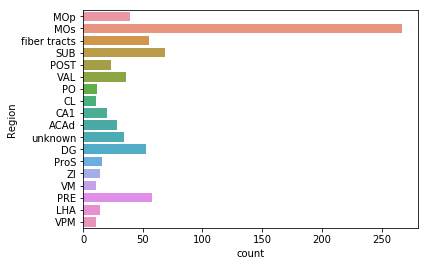

In [2]:
sf = ns.features['soma_features'].region
ct = sf["Region"].value_counts().sort_values(ascending=False)
_ = sns.countplot(y="Region", 
                  data=sf.loc[sf.Region.isin(ct.index[ct>10])],
                 )

In [3]:
_ = ns.ReduceDimUMAP(feature_set="projection_features", n_neighbors=100)


## Initialization for each cluster 

In [4]:
colname = ['Homogeneity','Completeness','V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient','parameter']
#method=['SNN_community','Kmeans'
#%% Store all the result
result_COMP = pd.DataFrame(columns = colname)

## For hierarchy

In [ ]:
#%% Store the result of Hierarchy
result_hier = pd.DataFrame(columns = colname)
L_method_list=['single', 'complete','average','weighted','centroid','median','ward']
L_metric_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
               'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
               'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
               'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
#linkage using 'yule' and 'jensenshannon' may result in a condensed distance matrix must contain only finite values.

criterionH_list=['inconsistent','distance','maxclust','monocrit','maxclust_monocrit']

hier_dict={'L_method':'single', 'L_metric':'euclidean','criterionH':'inconsistent', 'depth':2,'R':None,'t':0.9,'optimal_ordering':False}
for L_methodidx in L_method_list:
    hier_dict.update(L_method = L_methodidx)
    for L_metricidx in L_metric_list:
        hier_dict.update(L_metric = L_metricidx )
        for criterionidx in criterionH_list:
            hier_dict.update(criterionH = criterionidx )   
            for depth_iter in range(2,15):
                hier_dict.update(depth = depth_iter ) 
                print(hier_dict)
                _ = ns. get_clusters(method='Hierarchy',karg_dict=hier_dict)
                h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
                if len(typeR)<2:
                    SS = 'below'
                elif len(typeR)>=ns.UMAP.shape[0]:
                    SS = 'above'
                else:
                    SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
                tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,str(hier_dict)]).T.copy()
                tempDF.columns=colname
                result_hier = result_hier.append(tempDF)    
idx_hier = ['Hier'+str(x) for x in range(result_hier.shape[0])]    
result_hier['idx'] = idx_hier
result_hier.set_index('idx',inplace=True)    

In [6]:
#result_hier.to_excel('/home/penglab/Documents/dataSource/result_hier.xlsx')
result_hier = pd.read_excel('/home/penglab/Documents/dataSource/result_hier.xlsx', index_col=0)

## For KMeans


In [ ]:
from sklearn import metrics
colname = ['Homogeneity','Completeness','V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient','parameter']
#method=['SNN_community','Kmeans'
result_kmeans = pd.DataFrame(columns = colname)

init_list=['k-means++','random']
algorithm_list = ['auto','full','elkan']
precompute_distances_list = ['auto', True, False]
n_init_list=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine',
               'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 
               'mahalanobis', 'matching','minkowski','rogerstanimoto', 'russellrao',
               'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
#linkage using 'yule' and 'jensenshannon' may result in a condensed distance matrix must contain only finite values.

criterionH_list='inconsistent','distance','maxclust','monocrit','maxclust_monocrit'

kmeans_dict={'n_clusters':20, 'init':'k-means++', 'n_init':10, 'max_iter':300, 'tol':0.0001,'precompute_distances':'auto', 'verbose':0, 'random_state':None,'copy_x': True,'n_jobs':None, 'algorithm':'auto'}

for init_idx in init_list:
    kmeans_dict.update(init = init_idx)
    for algorithm_idx in algorithm_list:
        kmeans_dict.update(algorithm = algorithm_idx )
        for precompute_distances_idx in precompute_distances_list:
            kmeans_dict.update(precompute_distances = precompute_distances_idx )
            for n_clustersidx in range(3,25):
                kmeans_dict.update(n_clusters = n_clustersidx)     
                #Number of time the k-means algorithm will be run with different centroid seeds. The final results will be the best output of n_init consecutive runs in terms of inertia.
                for n_initidx in range(7,25):
                    kmeans_dict.update(n_init = n_initidx) 
                    print(kmeans_dict)
                    _ = ns. get_clusters(method='Kmeans',karg_dict=kmeans_dict)
                    h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
                    if len(typeR)<2:
                        SS = 'below'
                    elif len(typeR)>=ns.UMAP.shape[0]:
                        SS = 'above'
                    else:
                        SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
                    
                    tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,str(kmeans_dict)]).T.copy()
                    tempDF.columns=colname
                    result_kmeans = result_kmeans.append(tempDF)         
idx_kmeans = ['KMeans'+str(x) for x in range(result_kmeans.shape[0])]    
result_kmeans['idx'] = idx_kmeans
result_kmeans.set_index('idx',inplace=True)       

In [7]:
#result_kmeans.to_excel('/home/penglab/Documents/dataSource/result_kmeans.xlsx')
result_kmeans = pd.read_excel('/home/penglab/Documents/dataSource/result_kmeans.xlsx', index_col=0)

## for DBSCAN


In [ ]:
result_dbscan = pd.DataFrame(columns = colname)
algorithm_list = ['auto', 'ball_tree', 'kd_tree', 'brute']
dbscan_dict={'eps':20, 'min_samples':5, 'metric':'euclidean','metric_params':None, 'algorithm':'auto', 'leaf_size':30, 'p':None,'n_jobs':None}
for algorithm_idx in algorithm_list:
    dbscan_dict.update(algorithm = algorithm_idx )
    for epsidx in np.arange(0,1,0.005)[1:]:
        dbscan_dict.update(eps = epsidx)
        #print(result_dbscan )
        _ = ns. get_clusters(method='DBSCAN',karg_dict=dbscan_dict)
        h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
        if len(typeR)<2:
            SS = 'below'
        elif len(typeR)>=ns.UMAP.shape[0]:
            SS = 'above'
        else:
            SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
        tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,str(dbscan_dict)]).T.copy()
        tempDF.columns=colname
        result_dbscan = result_dbscan.append(tempDF)        
idx_dbscan = ['DBSCAN'+str(x) for x in range(result_dbscan.shape[0])]    
result_dbscan['idx'] = idx_dbscan
result_dbscan.set_index('idx',inplace=True)       

In [8]:
#result_dbscan.to_excel('/home/penglab/Documents/dataSource/result_dbscan.xlsx')
result_dbscan = pd.read_excel('/home/penglab/Documents/dataSource/result_dbscan.xlsx', index_col=0)

## for HDBSCAN


In [ ]:
result_hdbscan = pd.DataFrame(columns = colname)
from sklearn.neighbors.ball_tree import BallTree
metric_list = ['euclidean', 'manhattan', 'cityblock', 'l1', 'chebyshev','l2', 'minkowski']
#, 'p', 'seuclidean', 
              # 'mahalanobis', 'wminkowski', 'hamming', 'canberra', 'braycurtis', 'matching', 'jaccard', 'dice', 
             #  'kulsinski', 'rogerstanimoto', 'russellrao', 'sokalmichener','sokalsneath', 'haversine', 'pyfunc']
#['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan','braycurtis',
              # 'canberra', 'chebyshev', 'correlation', 'dice', 'hamming', 'jaccard', 
             #  'kulsinski', 'mahalanobis', 'matching', 'minkowski','rogerstanimoto', 
              # 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean']
#check use of 'boruvka_balltree' for algorithm later
algorithm_list = ['best', 'generic','prims_kdtree', 'boruvka_kdtree']#, 
cluster_selection_method_list = ['leaf','eom']
hdbscan_dict={'min_cluster_size':5, 'metric':'euclidean','alpha':1.0, 'min_samples':1,
              'p':2,'algorithm':'best', 'leaf_size':40, 'approx_min_span_tree':True,
              'gen_min_span_tree':False,'core_dist_n_jobs':4,'cluster_selection_method':'eom',
              'allow_single_cluster': False,'prediction_data':False,
              'match_reference_implementation':False}

for algorithm_idx in algorithm_list:
    hdbscan_dict.update(algorithm = algorithm_idx)
    for metric_idx in metric_list:
        hdbscan_dict.update(metric = metric_idx)
        for cluster_selection_method_idx in cluster_selection_method_list:
            hdbscan_dict.update(cluster_selection_method = cluster_selection_method_idx )
            for alpha_idx in np.arange(0.8,1.5,0.1):
                hdbscan_dict.update(alpha = alpha_idx)
                for min_samples_iter in range(1,10):
                    hdbscan_dict.update(min_samples = min_samples_iter)
            
                    #print(hdbscan_dict)
                    _ = ns. get_clusters(method='HDBSCAN',karg_dict=hdbscan_dict)
                    h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
                    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
                    if len(typeR)<2:
                        SS = 'below'
                    elif len(typeR)>=ns.UMAP.shape[0]:
                        SS = 'above'
                    else:
                        SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
                    print(hdbscan_dict)
                    tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,str(hdbscan_dict)]).T.copy()
                    tempDF.columns = colname
                    result_hdbscan = result_hdbscan.append(tempDF)     
                    
idx_hdbscan = ['HDBSCAN'+str(x) for x in range(result_hdbscan.shape[0])]    
result_hdbscan['idx'] = idx_hdbscan
result_hdbscan.set_index('idx',inplace=True)       



In [9]:
#result_hdbscan.to_excel('/home/penglab/Documents/dataSource/result_hdbscan.xlsx')
result_hdbscan = pd.read_excel('/home/penglab/Documents/dataSource/result_hdbscan.xlsx', index_col=0)

## Pre-process the data
* result_hier      9100 x 7
* result_kmeans    7128 x 7
* result_dbscan    796  x 7
* result_hdbscan   3528  x 7

## Plot each kind of clustering result separately

* Each line corresponds to one column
* Show the fluctuation of each method using different parameters



In [12]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
def plot_col(dflocal,cluster_name,dropF):
    #result_hier_self=result_hier.copy()
    if dropF:
        df = dflocal.iloc[:,:-1].drop_duplicates()
    else:
        df = dflocal.copy()
    df = df[df['Silhouette Coefficient']!='below'].copy()
    df = df[df['Silhouette Coefficient']!='above'].copy()
    col_Homogeneity = df['Homogeneity']
    col_Completeness = df['Completeness']
    col_Vmeasure= df['V-measure']
    col_ARI = df['Adjusted Rand Index']
    col_AMI = df['Adjusted Mutual Information']
    col_SC = df['Silhouette Coefficient']
    
    x_axix=range(1,df.shape[0]+1)

    plt.title('Value fluctuation for '+str(cluster_name)+'with '+str(df.shape[0])+' unique trials')
    plt.plot(x_axix, col_Homogeneity.tolist(), color='green', label='Homogeneity')
    plt.plot(x_axix, col_Completeness.tolist(), color='brown', label='Completeness')
    plt.plot(x_axix, col_Vmeasure.tolist(),  color='skyblue', label='V-measure')
    plt.plot(x_axix, col_ARI.tolist(), color='blue', label='Adjusted Rand Index')
    plt.plot(x_axix, col_AMI.tolist(), color='magenta', label='Adjusted Mutual Information')
    plt.plot(x_axix, col_SC.tolist(), color='pink', label='Silhouette Coefficient')
    plt.legend() # 显示图例
    #a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
    #plt.xticks(arange(len(a)),a)
    plt.xlabel('Different Parameter Choices')
    plt.ylabel('metric')
    plt.show()

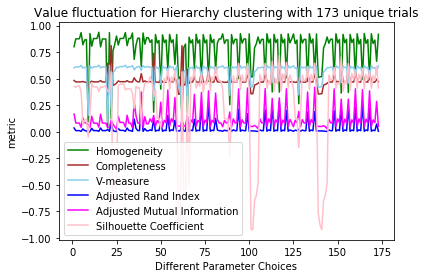

/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



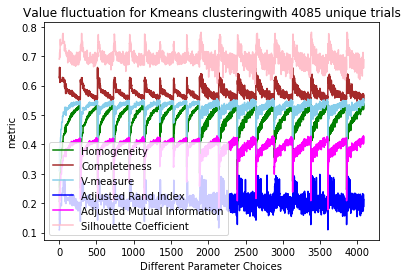

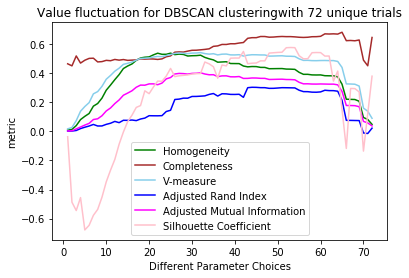

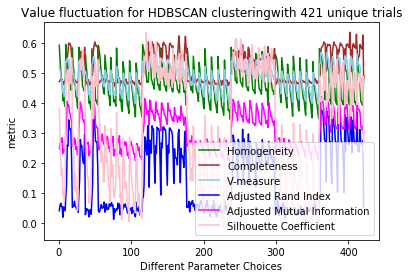

In [13]:

plot_col(result_hier.copy(),'Hierarchy clustering ',1)

plot_col(result_kmeans.copy(),'Kmeans clustering',1)

plot_col(result_dbscan.copy(),'DBSCAN clustering',1)

plot_col(result_hdbscan.copy(),'HDBSCAN clustering',1)

# To compare all the results for different metirc
### Detail
* metric can be 'Homogeneity','Completeness','V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient'
* Delete clustering result leading to cluster less than 2 or # of cluster = # of swc files

### Add SNN

In [14]:
result_snn= pd.DataFrame(columns = colname)
_ = ns. get_clusters(method='SNN_community',
                     karg_dict={'knn':5,
                                'metric':'minkowski',
                                'method':'FastGreedy'})
h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
if len(typeR)<2:
    SS = 'below'
elif len(typeR)>=ns.UMAP.shape[0]:
    SS = 'above'
else:
    SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
tempDF = pd.DataFrame([h, c,V,ARI,AMI,SS,'default']).T.copy()
tempDF.columns=colname
result_snn = result_snn.append(tempDF)

Result of SNN_community


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



In [15]:
import numpy as np
import ast
import matplotlib as mpl
import matplotlib.pyplot as plt
from pylab import *
def compare_bestmetric(strname):
    result_COMP = pd.DataFrame(columns =['method','parameter','num_Cluster'],index=['Hierarchy','Kmeans','DBSCAN','HDBSCAN','SNN'])
    #if strname=='Silhouette Coefficient':
    scresult_hier = result_hier.copy()
    scresult_kmeans = result_kmeans.copy()
    scresult_dbscan = result_dbscan.copy()
    scresult_hdbscan = result_hdbscan.copy()
    scresult_snn = result_snn.copy()
    
    scresult_hier = scresult_hier[scresult_hier['Silhouette Coefficient']!='below'].copy()
    scresult_kmeans = scresult_kmeans[scresult_kmeans['Silhouette Coefficient']!='below'].copy()
    scresult_dbscan = scresult_dbscan[scresult_dbscan['Silhouette Coefficient']!='below'].copy()
    scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['Silhouette Coefficient']!='below'].copy()
    scresult_snn = scresult_snn[scresult_snn['Silhouette Coefficient']!='below'].copy()
    
    scresult_hier = scresult_hier[scresult_hier['Silhouette Coefficient']!='above'].copy()
    scresult_kmeans = scresult_kmeans[scresult_kmeans['Silhouette Coefficient']!='above'].copy()
    scresult_dbscan = scresult_dbscan[scresult_dbscan['Silhouette Coefficient']!='above'].copy()
    scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['Silhouette Coefficient']!='above'].copy()
    scresult_snn = scresult_snn[scresult_snn['Silhouette Coefficient']!='above'].copy()
    
    scresult_hier = scresult_hier[scresult_hier['Completeness']!=1].copy()
    scresult_kmeans = scresult_kmeans[scresult_kmeans['Completeness']!=1].copy()
    scresult_dbscan = scresult_dbscan[scresult_dbscan['Completeness']!=1].copy()
    scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['Completeness']!=1].copy()
    scresult_snn = scresult_snn[scresult_snn['Completeness']!=1].copy()
    row_hier = scresult_hier[scresult_hier[strname]==scresult_hier[strname].max()].iloc[0,:]
    row_kmeans = scresult_kmeans[scresult_kmeans[strname]==scresult_kmeans[strname].max()].iloc[0,:]
    row_dbscan = scresult_dbscan[scresult_dbscan[strname]==scresult_dbscan[strname].max()].iloc[0,:]
    row_hdbscan = scresult_hdbscan[scresult_hdbscan[strname]==scresult_hdbscan[strname].max()].iloc[0,:]
    row_snn = scresult_snn[scresult_snn[strname]==scresult_snn[strname].max()].iloc[0,:]
    '''
    else:        
        row_hier = result_hier[result_hier[strname]==np.max(result_hier[strname])].iloc[0,:]
        row_kmeans = result_kmeans[result_kmeans[strname]==np.max(result_kmeans[strname])].iloc[0,:]
        row_dbscan = result_dbscan[result_dbscan[strname]==np.max(result_dbscan[strname])].iloc[0,:]
        row_hdbscan = result_hdbscan[result_hdbscan[strname]==np.max(result_hdbscan[strname])].iloc[0,:]
    '''
    x_axix=range(1,len(colname))
    
    
    hier_dict=row_hier['parameter']
    result_COMP.loc['Hierarchy']['parameter'] = (hier_dict)
    _ = ns. get_clusters(method='Hierarchy',karg_dict=ast.literal_eval(hier_dict))
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using Hierarchy is '+str(hier_dict))
    result_COMP.loc['Hierarchy']['num_Cluster']=len(typeR)
    
    kmeans_dict=row_kmeans['parameter']
    result_COMP.loc['Kmeans']['parameter'] = kmeans_dict
    _ = ns. get_clusters(method='Kmeans',karg_dict=ast.literal_eval(kmeans_dict))
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using Kmeans is '+str(kmeans_dict))
    result_COMP.loc['Kmeans']['num_Cluster']=len(typeR)
    
    dbscan_dict=row_dbscan['parameter']
    result_COMP.loc['DBSCAN']['parameter'] = dbscan_dict
    _ = ns. get_clusters(method='DBSCAN',karg_dict=ast.literal_eval(dbscan_dict))
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using DBSCAN is '+str(dbscan_dict))
    result_COMP.loc['DBSCAN']['num_Cluster']=len(typeR)
    
    hdbscan_dict=row_hdbscan['parameter']
    result_COMP.loc['HDBSCAN']['parameter'] = hdbscan_dict
    _ = ns. get_clusters(method='HDBSCAN',karg_dict=ast.literal_eval(hdbscan_dict))
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using HDBSCAN is '+str(hdbscan_dict))
    result_COMP.loc['HDBSCAN']['num_Cluster']=len(typeR)
    
    #snn_dict=row_snn['parameter']
    result_COMP.loc['SNN']['parameter'] = str({'knn':5,'metric':'minkowski','method':'FastGreedy'})
    _ = ns. get_clusters(method='SNN_community',karg_dict={'knn':5,'metric':'minkowski','method':'FastGreedy'})
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using HDBSCAN is '+str(hdbscan_dict))
    result_COMP.loc['SNN']['num_Cluster']=len(typeR)    
    
    plt.title('Result Analysis w.r.t. highest '+str(strname))
    plt.plot(x_axix, row_hier.tolist()[:-1], color='green', label='Hierarchy clustering')
    plt.plot(x_axix, row_kmeans.tolist()[:-1], color='red', label='KMeans clustering')
    plt.plot(x_axix, row_dbscan.tolist()[:-1],  color='skyblue', label='DBSCAN clustering')
    plt.plot(x_axix, row_hdbscan.tolist()[:-1], color='blue', label='HDBSCAN clustering')
    plt.plot(x_axix, row_snn.tolist()[:-1], color='brown', label='SNN clustering')
    plt.legend() # 显示图例
    a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
    plt.xticks(arange(len(a)),a)
    plt.ylabel('metric')
    plt.show()
    result_COMP['method']=result_COMP.index
    #print(result_COMP)
    return result_COMP
    

/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Result of Hierarchy CLustering
Result of Kmeans
Result of DBSCAN
Result of HDBSCAN
Result of SNN_community


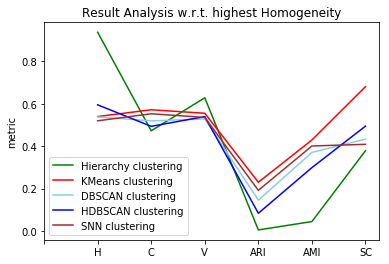

,method,parameter,num_Cluster
Hierarchy,Hierarchy,"{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}",695
Kmeans,Kmeans,"{'n_clusters': 24, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}",24
DBSCAN,DBSCAN,"{'eps': 0.155, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",43
HDBSCAN,HDBSCAN,"{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False...",64
SNN,SNN,"{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}",28


{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
{'n_clusters': 24, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'eps': 0.155, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 1, 'p': 2, 'algorithm': 'best', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}
Result of Hierarchy CLustering
Result of Kmeans
Result of DBSCAN
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Result of SNN_community


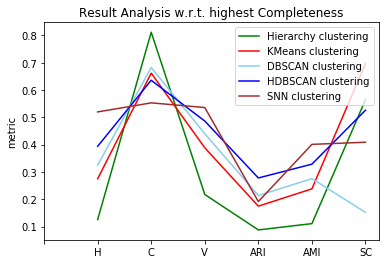

,method,parameter,num_Cluster
Hierarchy,Hierarchy,"{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}",2
Kmeans,Kmeans,"{'n_clusters': 4, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}",4
DBSCAN,DBSCAN,"{'eps': 0.49, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",8
HDBSCAN,HDBSCAN,"{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': Fa...",20
SNN,SNN,"{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}",28


{'L_method': 'single', 'L_metric': 'correlation', 'criterionH': 'inconsistent', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
{'n_clusters': 4, 'init': 'k-means++', 'n_init': 10, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'eps': 0.49, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 1.2, 'min_samples': 9, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}
Result of Hierarchy CLustering
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Result of DBSCAN
Result of HDBSCAN
Result of SNN_community


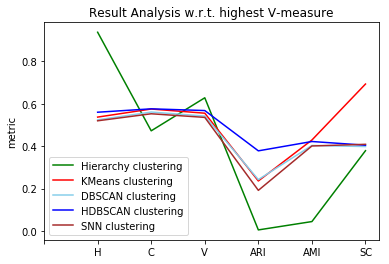

,method,parameter,num_Cluster
Hierarchy,Hierarchy,"{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}",695
Kmeans,Kmeans,"{'n_clusters': 23, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}",23
DBSCAN,DBSCAN,"{'eps': 0.19, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",25
HDBSCAN,HDBSCAN,"{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': Fa...",53
SNN,SNN,"{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}",28


{'L_method': 'single', 'L_metric': 'chebyshev', 'criterionH': 'maxclust_monocrit', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
{'n_clusters': 23, 'init': 'random', 'n_init': 20, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'eps': 0.19, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}
Result of Hierarchy CLustering
Result of Kmeans
Result of DBSCAN
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Result of SNN_community


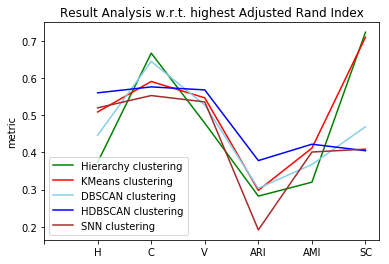

,method,parameter,num_Cluster
Hierarchy,Hierarchy,"{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}",7
Kmeans,Kmeans,"{'n_clusters': 19, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}",19
DBSCAN,DBSCAN,"{'eps': 0.25, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",16
HDBSCAN,HDBSCAN,"{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': Fa...",53
SNN,SNN,"{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}",28


{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
{'n_clusters': 19, 'init': 'random', 'n_init': 7, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'eps': 0.25, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}
Result of Hierarchy CLustering
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Result of DBSCAN
Result of HDBSCAN
Result of SNN_community


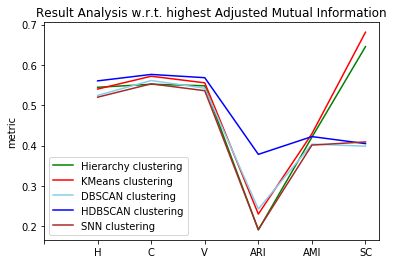

,method,parameter,num_Cluster
Hierarchy,Hierarchy,"{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}",33
Kmeans,Kmeans,"{'n_clusters': 24, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}",24
DBSCAN,DBSCAN,"{'eps': 0.19, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",25
HDBSCAN,HDBSCAN,"{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': Fa...",53
SNN,SNN,"{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}",28


{'L_method': 'weighted', 'L_metric': 'cityblock', 'criterionH': 'distance', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
{'n_clusters': 24, 'init': 'random', 'n_init': 21, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': False, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'elkan'}
{'eps': 0.19, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}
{'min_cluster_size': 5, 'metric': 'chebyshev', 'alpha': 0.8, 'min_samples': 3, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}
Result of Hierarchy CLustering
Result of Kmeans
Result of DBSCAN
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Result of SNN_community


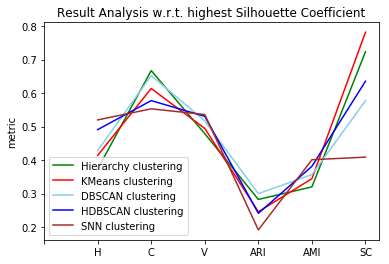

,method,parameter,num_Cluster
Hierarchy,Hierarchy,"{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}",7
Kmeans,Kmeans,"{'n_clusters': 10, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}",10
DBSCAN,DBSCAN,"{'eps': 0.33, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",14
HDBSCAN,HDBSCAN,"{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': Fa...",27
SNN,SNN,"{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}",28


{'L_method': 'average', 'L_metric': 'seuclidean', 'criterionH': 'distance', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}
{'n_clusters': 10, 'init': 'random', 'n_init': 17, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': 'auto', 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'auto'}
{'eps': 0.33, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}
{'min_cluster_size': 5, 'metric': 'euclidean', 'alpha': 0.8, 'min_samples': 6, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': False, 'match_reference_implementation': False}
{'knn': 5, 'metric': 'minkowski', 'method': 'FastGreedy'}


In [16]:
from IPython.display import display
#'Homogeneity','Completeness','V-measure' did not result in satisfying result
metriclist= ['Homogeneity','Completeness','V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']

for metric_iter in metriclist:
    bestDF = compare_bestmetric(metric_iter)
    pd.set_option('max_colwidth',300)
    display(bestDF)
    for i in bestDF['parameter']:
        print(i)

In [17]:
colname

['Homogeneity',
 'Completeness',
 'V-measure',
 'Adjusted Rand Index',
 'Adjusted Mutual Information',
 'Silhouette Coefficient',
 'parameter']

# Best average among ARI, AMI and SC

In [348]:
import numpy as np
import ast
import matplotlib as mpl
import matplotlib.pyplot as plt
from pylab import *
def compare_bestavg():
    strname='avg'
    result_avg = pd.DataFrame(columns =['method','parameter','num_Cluster','avg'],index=['Hierarchy','Kmeans','DBSCAN','HDBSCAN','SNN'])
    #if strname=='Silhouette Coefficient':
    scresult_hier = result_hier.copy()
    scresult_kmeans = result_kmeans.copy()
    scresult_dbscan = result_dbscan.copy()
    scresult_hdbscan = result_hdbscan.copy()
    scresult_snn = result_snn.copy()
    
    scresult_hier = scresult_hier[scresult_hier['Silhouette Coefficient']!='below'].copy()
    scresult_kmeans = scresult_kmeans[scresult_kmeans['Silhouette Coefficient']!='below'].copy()
    scresult_dbscan = scresult_dbscan[scresult_dbscan['Silhouette Coefficient']!='below'].copy()
    scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['Silhouette Coefficient']!='below'].copy()
    scresult_snn = scresult_snn[scresult_snn['Silhouette Coefficient']!='below'].copy()
    
    scresult_hier = scresult_hier[scresult_hier['Silhouette Coefficient']!='above'].copy()
    scresult_kmeans = scresult_kmeans[scresult_kmeans['Silhouette Coefficient']!='above'].copy()
    scresult_dbscan = scresult_dbscan[scresult_dbscan['Silhouette Coefficient']!='above'].copy()
    scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['Silhouette Coefficient']!='above'].copy()
    scresult_snn = scresult_snn[scresult_snn['Silhouette Coefficient']!='above'].copy()
    
    scresult_hier = scresult_hier[scresult_hier['Completeness']!=1].copy()
    scresult_kmeans = scresult_kmeans[scresult_kmeans['Completeness']!=1].copy()
    scresult_dbscan = scresult_dbscan[scresult_dbscan['Completeness']!=1].copy()
    scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['Completeness']!=1].copy()
    scresult_snn = scresult_snn[scresult_snn['Completeness']!=1].copy()
 
    scresult_hier['avg']=scresult_hier[['Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']].sum(axis = 1)/4
    scresult_kmeans['avg']=scresult_kmeans[['Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']].sum(axis = 1)/4
    scresult_dbscan['avg']=scresult_dbscan[['Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']].sum(axis = 1)/4
    scresult_hdbscan['avg']=scresult_hdbscan[['Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']].sum(axis = 1)/4
    scresult_snn['avg']=scresult_snn[['V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']].sum(axis = 1)/4
    
    row_hier = scresult_hier[scresult_hier[strname]==scresult_hier[strname].max()].iloc[0,:]
    row_kmeans = scresult_kmeans[scresult_kmeans[strname]==scresult_kmeans[strname].max()].iloc[0,:]
    row_dbscan = scresult_dbscan[scresult_dbscan[strname]==scresult_dbscan[strname].max()].iloc[0,:]
    row_hdbscan = scresult_hdbscan[scresult_hdbscan[strname]==scresult_hdbscan[strname].max()].iloc[0,:]
    row_snn = scresult_snn[scresult_snn[strname]==scresult_snn[strname].max()].iloc[0,:]

    x_axix=range(1,len(colname))
    
    
    hier_dict=row_hier['parameter']
    result_avg.loc['Hierarchy']['parameter'] = (hier_dict)
    result_avg.loc['Hierarchy']['avg'] = row_hier['avg']
    _ = ns. get_clusters(method='Hierarchy',karg_dict=ast.literal_eval(hier_dict))
    _ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using Hierarchy is '+str(hier_dict))
    result_avg.loc['Hierarchy']['num_Cluster']=len(typeR)
    
    kmeans_dict=row_kmeans['parameter']
    result_avg.loc['Kmeans']['parameter'] = kmeans_dict
    result_avg.loc['Kmeans']['avg'] = row_kmeans['avg']
    _ = ns. get_clusters(method='Kmeans',karg_dict=ast.literal_eval(kmeans_dict))
    _ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using Kmeans is '+str(kmeans_dict))
    result_avg.loc['Kmeans']['num_Cluster']=len(typeR)
    
    dbscan_dict=row_dbscan['parameter']
    result_avg.loc['DBSCAN']['parameter'] = dbscan_dict
    result_avg.loc['DBSCAN']['avg'] = row_dbscan['avg']
    _ = ns. get_clusters(method='DBSCAN',karg_dict=ast.literal_eval(dbscan_dict))
    _ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using DBSCAN is '+str(dbscan_dict))
    result_avg.loc['DBSCAN']['num_Cluster']=len(typeR)
    
    hdbscan_dict=row_hdbscan['parameter']
    result_avg.loc['HDBSCAN']['parameter'] = hdbscan_dict
    result_avg.loc['HDBSCAN']['avg'] = row_hdbscan['avg']
    _ = ns. get_clusters(method='HDBSCAN',karg_dict=ast.literal_eval(hdbscan_dict))
    _ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using HDBSCAN is '+str(hdbscan_dict))
    result_avg.loc['HDBSCAN']['num_Cluster']=len(typeR)
    
    #snn_dict=row_snn['parameter']
    result_avg.loc['SNN']['parameter'] = {'knn':5,'metric':'minkowski','method':'FastGreedy'}
    result_avg.loc['SNN']['avg'] = row_snn['avg']
    _ = ns. get_clusters(method='SNN_community',karg_dict={'knn':5,'metric':'minkowski','method':'FastGreedy'})
    _ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print('The parameter resulting in best '+str(strname)+' using HDBSCAN is '+str(hdbscan_dict))
    result_avg.loc['SNN']['num_Cluster']=len(typeR)    
    
    plt.title('Result Analysis w.r.t. highest avg value among ARI, AMI and SC')
    plt.plot(x_axix, row_hier.tolist()[:-2], color='green', label='Hierarchy clustering')
    plt.plot(x_axix, row_kmeans.tolist()[:-2], color='red', label='KMeans clustering')
    plt.plot(x_axix, row_dbscan.tolist()[:-2],  color='skyblue', label='DBSCAN clustering')
    plt.plot(x_axix, row_hdbscan.tolist()[:-2], color='blue', label='HDBSCAN clustering')
    plt.plot(x_axix, row_snn.tolist()[:-2], color='brown', label='SNN clustering')
    plt.legend() # 显示图例
    a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
    plt.xticks(arange(len(a)),a)
    plt.ylabel('metric')
    plt.show()
    result_avg['method']=result_avg.index
    #print(result_COMP)
    return result_avg
    

/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want 

Result of Hierarchy CLustering


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


Result of Kmeans


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Result of DBSCAN


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


Result of HDBSCAN


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


Result of SNN_community


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

ValueError: x and y must have same first dimension, but have shapes (8,) and (6,)

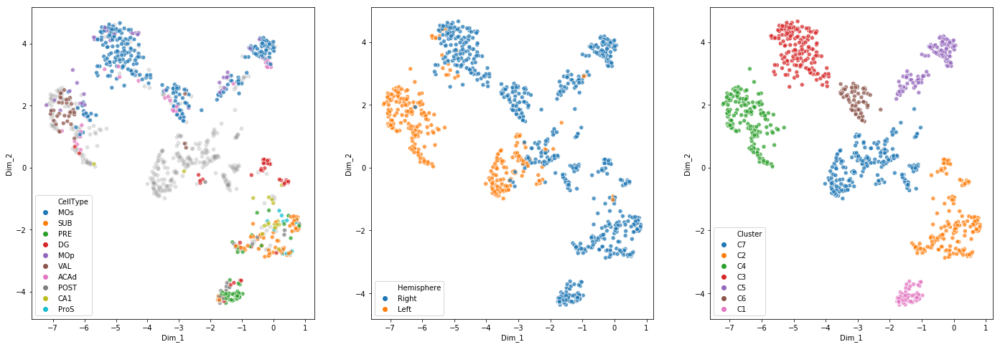

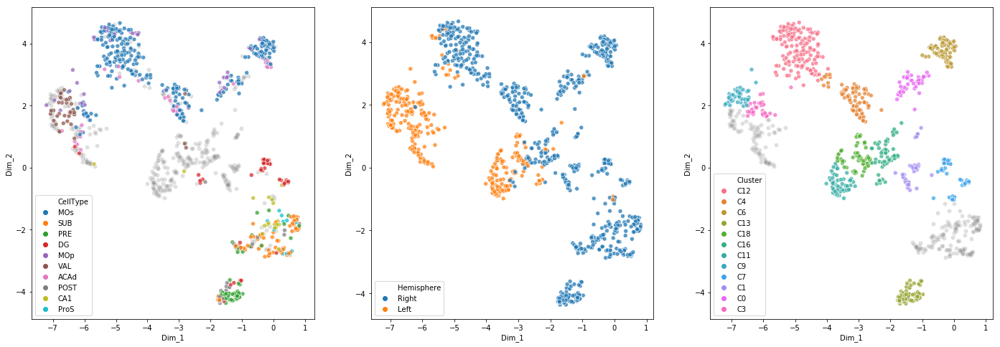

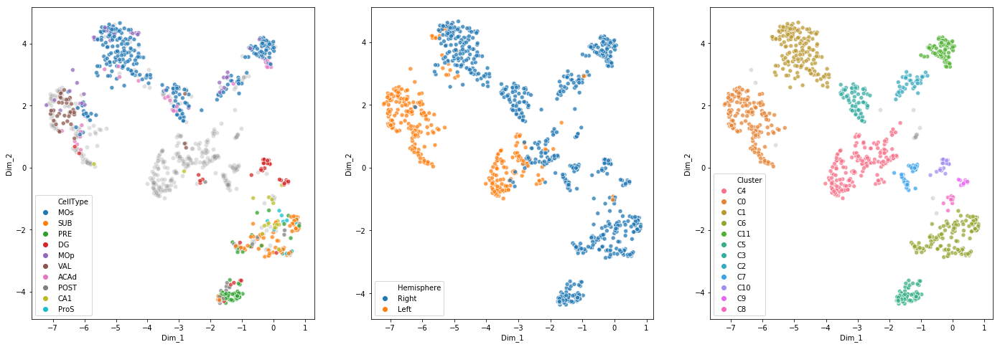

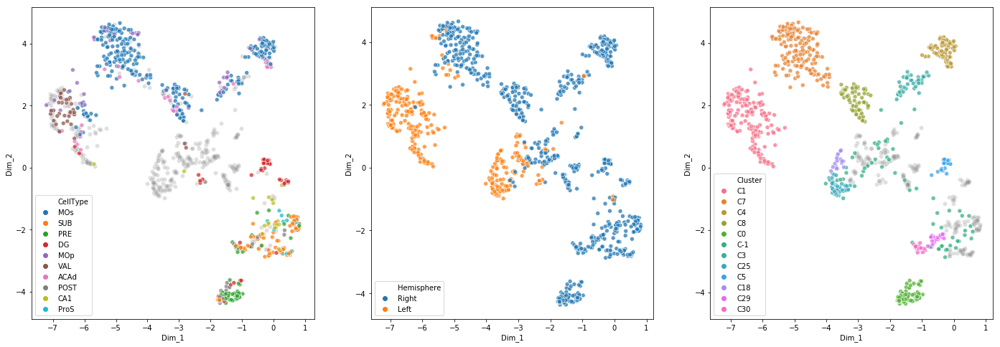

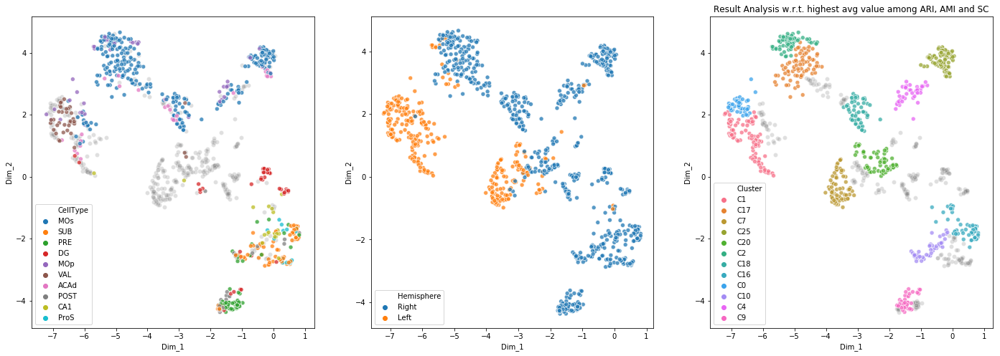

In [349]:
compare_bestavg()

# Look into the detail under different clustering method

* Drop the duplicated rows
* Rerun the clustering method and obtain number of cluster in each method
## Return number of cluster for each prameter
* function obtainClusterNum(dflocal,cluster_method,dropF)

In [361]:
import ast

def obtainClusterNum(dflocal,cluster_method,dropF):
    #result_hier_self=result_hier.copy()
    colname = ['Homogeneity','Completeness','V-measure','Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient','parameter']
    if dropF:
        dflocal_sub = dflocal.iloc[:,:-1].drop_duplicates()
        indexls = dflocal_sub.index
    else:
        indexls = dflocal.index

    df = pd.DataFrame(columns = colname,index = indexls)
    df['Cluster Num'] = 0
    df['parameter'] = dflocal.loc[indexls,'parameter']
    for iter_idx in df.index:
        _ = ns. get_clusters(method = cluster_method,karg_dict = ast.literal_eval(df.loc[iter_idx]['parameter']))
        h = metrics.homogeneity_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        c = metrics.completeness_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
        if len(typeR)<2:
            SS = 'below'
        elif len(typeR)>=ns.UMAP.shape[0]:
            SS = 'above'
        else:
            SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
        df.loc[iter_idx,'Homogeneity'] = h
        df.loc[iter_idx,'Completeness'] = c
        df.loc[iter_idx,'V-measure'] = V
        df.loc[iter_idx,'Adjusted Rand Index'] = ARI
        df.loc[iter_idx,'Adjusted Mutual Information'] = AMI
        df.loc[iter_idx,'Silhouette Coefficient'] = SS
        typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
        #print(hdbscan_dict)
        df.loc[iter_idx,'Cluster Num'] = len(typeR)
                        
    return df

#### unique_* is a dataframe containing the unique rows of the original trails, it also record number of cluster under that parameter

In [362]:
#unique_hier = obtainClusterNum(result_hier.copy(),'Hierarchy',1)
#unique_hier.to_excel('/home/penglab/Documents/dataSource/unique_hier.xlsx')
unique_hier = pd.read_excel('/home/penglab/Documents/dataSource/unique_hier.xlsx', index_col=0)

In [371]:
#unique_kmeans = obtainClusterNum(result_kmeans.copy(),'Kmeans',1)
#unique_kmeans.to_excel('/home/penglab/Documents/dataSource/unique_kmeans.xlsx')
unique_kmeans = pd.read_excel('/home/penglab/Documents/dataSource/unique_kmeans.xlsx', index_col=0)

In [366]:
#unique_dbscan = obtainClusterNum(result_dbscan.copy(),'DBSCAN',1)
#unique_dbscan.to_excel('/home/penglab/Documents/dataSource/unique_dbscan.xlsx')
unique_dbscan = pd.read_excel('/home/penglab/Documents/dataSource/unique_dbscan.xlsx', index_col=0)

In [367]:
#unique_hdbscan = obtainClusterNum(result_hdbscan.copy(),'HDBSCAN',1)
#unique_hdbscan.to_excel('/home/penglab/Documents/dataSource/unique_hdbscan.xlsx')
unique_hdbscan = pd.read_excel('/home/penglab/Documents/dataSource/unique_hdbscan.xlsx', index_col=0)


### Show the box plot for different clustering method

In [372]:
from IPython.display import display
pd.set_option('max_colwidth',300)
def boxCLUSTER(unique_df,cluster_method):
    fig1, ax1 = plt.subplots()
    ax1.set_title(cluster_method)
    ax1.boxplot(unique_df['Cluster Num'])    

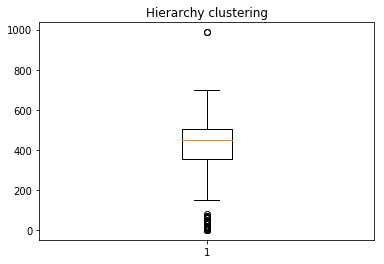

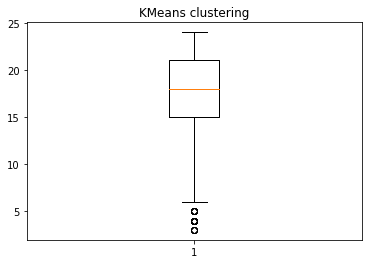

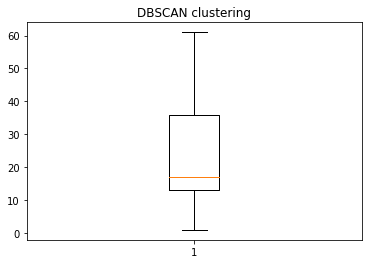

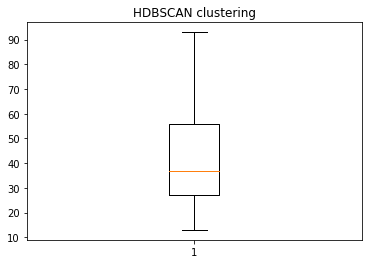

In [373]:
boxCLUSTER(unique_hier,'Hierarchy clustering')
boxCLUSTER(unique_kmeans,'KMeans clustering')
boxCLUSTER(unique_dbscan,'DBSCAN clustering')
boxCLUSTER(unique_hdbscan,'HDBSCAN clustering')

#  Look into the soma intra-cluster and inter-cluster distance
### function soma_Distance(uniqueDF,cluster_method,swcDF,metric,kvalue)
* **uniqueDF** is the dataframe with unrepeated parameters
* **cluster_method** can be 'Hierarchy','Kmeans', 'DBSCAN','HDBSCAN','' 
* **swcDF** is the dataframe containing the coordinate of the soma
* **metric** can be 'braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine', 'dice', 'euclidean', 'hamming', 'jaccard', 'jensenshannon', 'kulsinski', 'mahalanobis', 'matching', 'minkowski', 'rogerstanimoto', 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean', 'yule'
* **kvalue** can be string'all', it can also be a certain number. In that case, the inter-cluster distance will only count the k-nearest other-cluster soma.
* **flipF**: 
    * if 1, will flip all the soma to the same hemishphere
    
* **size_Z** the size of z axis of the brain
* **PERFORmetric**, a specific metric to maximize, can be 'Homogeneity', 'Completeness', 'V-measure', 'Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient'

In [404]:
import ast

import numpy as np
import matplotlib as mpl
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
def soma_Distance(uniqueDF,cluster_method,swcDF,metric,kvalue,flipF,size_Z,PERFORmetric):
    somaDF = swcDF.copy()
    if flipF:
        flipZlist=[]
        for iterz in swcDF['z']:
            if iterz>0.5*size_Z:
                flipZlist.append(size_Z-iterz)
            else:
                flipZlist.append(iterz)
        del somaDF['z']
        somaDF['z'] = flipZlist
            
    df_pre = uniqueDF.copy()
    df_pre = df_pre[df_pre['Silhouette Coefficient']!='below'].copy()
    df_pre = df_pre[df_pre['Silhouette Coefficient']!='above'].copy()
    df_pre = df_pre[df_pre['Completeness']!=1].copy()
    
    if PERFORmetric in ['Homogeneity', 'Completeness', 'V-measure', 'Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']:
        df_pre.sort_values(PERFORmetric,inplace=True,ascending=False)
        delist = df_pre.index[min(100,uniqueDF.shape[0]):]
        df_pre.drop(delist,inplace =True)
            


        
    index_ls = df_pre.index

    colname = ['V','ARI','AMI','SC','parameter','Cluster Num','label list','AVG_intra','AVG_inter']
    df = pd.DataFrame(columns = colname,index = index_ls)
    df['parameter'] = df_pre.loc[index_ls,'parameter']

    #under each parameter
    for iter_idx in df.index:
        _ = ns. get_clusters(method = cluster_method,karg_dict = ast.literal_eval(df.loc[iter_idx]['parameter']))
        somaDF['cluster'] = ns.metadata['Cluster']
        
        V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
        if cluster_method == 'HDBSCAN':
            delist=np.array([])
            for itertype in typeR:
                if itertype[1]=='-':
                    delist = np.append(delist,itertype)
                if itertype[1]=='0':
                    delist=np.append(delist,itertype)
            detailDF = pd.DataFrame(index = np.setdiff1d(typeR,delist),columns = ['Cluster Type','INTRAlist','INTERlist','AVG_intra','AVG_inter'])
            df.loc[iter_idx,'label list'] = ' '.join([str(i) for i in np.setdiff1d(typeR,delist)])  
        else:
            detailDF = pd.DataFrame(index = typeR,columns = ['Cluster Type','INTRAlist','INTERlist','AVG_intra','AVG_inter'])
            df.loc[iter_idx,'label list'] = ' '.join([str(i) for i in typeR])  
        detailDF.loc[:,'Cluster Type'] = detailDF.index
        if len(typeR)<2:
            SS = 'below'
        elif len(typeR)>=ns.UMAP.shape[0]:
            SS = 'above'
        else:
            SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
            #LABEL LIST CAN BE DETELETED LATER
        

        #UNDER EACH PARAMETER
        # for each cluster result
        for label_idx in typeR:
            intra_list = []
            inter_list = []

            swc_intra = somaDF[somaDF['cluster'] ==label_idx].iloc[:,:-1].copy()#DF
            print(swc_intra.columns)
            swc_inter = somaDF[somaDF['cluster'] !=label_idx].iloc[:,:-1].copy()#DF
            value_intra = swc_intra.values
            value_inter = swc_inter.values
            
            sum_intra = np.zeros((value_intra.shape[0]-1,1))
            for i in range(value_intra.shape[0]):
                #exchange the specific row, make it to be the first row
                cal_intra = value_intra
                if i != 0:
                    cal_intra[[0,i],:] = cal_intra[[i,0],:]
                temp_intra = pdist(cal_intra, metric).reshape((len(pdist(cal_intra, metric)),1))
                # for each sample in that cluster, record the avg intra cluster distance
                intra_list.append(np.sum(temp_intra[:(value_intra.shape[0]-1),:])/(value_intra.shape[0]-1))
            # If a certai cluster only has 1 element, then the intra distance is 'nan'
            detailDF.loc[label_idx,'INTRAlist'] = intra_list#' '.join([str(i) for i in intra_list])    
            detailDF.loc[label_idx,'AVG_intra'] = np.mean(np.array(detailDF.loc[label_idx,'INTRAlist']))
            if kvalue == 'all':
                #sum inter will be a column vector, each element stores the corresponding distance
                sum_inter = np.zeros((value_inter.shape[0],1))
                # for each sample in that cluster
                for i in range(value_intra.shape[0]):
                    cal_inter = np.row_stack((value_intra[i,:],value_inter))
                    temp_inter = pdist(cal_inter, metric).reshape((len(pdist(cal_inter, metric)),1))[:(value_inter.shape[0]),:]
                    #assert(sum_inter.shape == temp_inter.shape,"Inter cluster record does not equal to number of out-cluster samples")
                    sum_inter = sum_inter + temp_inter
                # for each sample in that cluster, record the avg intra cluster distance    
                sum_inter = sum_inter/value_intra.shape[0]
                #row list
                inter_list = sum_inter.tolist()   
            else:
                #sum inter will be a column vector, each element stores the corresponding distance
                sum_inter = np.zeros((min(value_inter.shape[0],kvalue),1))
                # for each sample in that cluster
                for i in range(value_intra.shape[0]):
                    cal_inter = np.row_stack((value_intra[i,:],value_inter))
                    temp_inter = pdist(cal_inter, metric).reshape((len(pdist(cal_inter, metric)),1))[:(min(value_inter.shape[0],kvalue)),:]
                    #assert(sum_inter.shape == temp_inter.shape,"Inter cluster record does not equal to number of out-cluster samples")
                    sum_inter = sum_inter + temp_inter
                # for each sample in that cluster, record the avg intra cluster distance    
                sum_inter = sum_inter/value_intra.shape[0]
                #row list
                inter_list = sum_inter.tolist()                   
            detailDF.loc[label_idx,'INTERlist'] = inter_list   
            #assert(len(inter_list)==somaDF[somaDF['cluster'] !=label_idx].shape[0])
            detailDF.loc[label_idx,'AVG_inter'] = np.mean(np.array(detailDF.loc[label_idx,'INTERlist']))
            detailDF[detailDF .isnull()]=0

        df.loc[iter_idx,'AVG_intra'] = (detailDF['AVG_intra']).sum()/detailDF.shape[0]
        df.loc[iter_idx,'AVG_inter'] = (detailDF['AVG_inter']).sum()/detailDF.shape[0]
        df.loc[iter_idx,'V'] = V
        df.loc[iter_idx,'ARI'] = ARI
        df.loc[iter_idx,'AMI'] = AMI
        df.loc[iter_idx,'SC'] = SS
        typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
        #print(hdbscan_dict)
        df.loc[iter_idx,'Cluster Num'] = len(typeR)          
    return df

In [380]:
soma_hier = soma_Distance(unique_hier,'Hierarchy',ns.features['soma_features'].raw_data.copy(),'euclidean','all')
soma_hier.to_excel('/home/penglab/Documents/dataSource/soma_hier.xlsx')


Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering




*************Note:**************
Method centroid requires the distance metric to be Euclidean
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering




*************Note:**************
Method centroid requires the distance metric to be Euclidean


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering




*************Note:**************
Method median requires the distance metric to be Euclidean
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering




*************Note:**************
Method median requires the distance metric to be Euclidean


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLust

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

In [381]:
soma_kmeans = soma_Distance(unique_kmeans,'Kmeans',ns.features['soma_features'].raw_data.copy(),'euclidean','all')
soma_kmeans.to_excel('/home/penglab/Documents/dataSource/soma_kmeans.xlsx')

Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


In [384]:
soma_dbscan = soma_Distance(unique_dbscan,'DBSCAN',ns.features['soma_features'].raw_data.copy(),'euclidean','all')
soma_dbscan.to_excel('/home/penglab/Documents/dataSource/soma_dbscan.xlsx')

Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:71: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')


In [385]:
soma_hdbscan = soma_Distance(unique_hdbscan,'HDBSCAN',ns.features['soma_features'].raw_data.copy(),'euclidean','all')
soma_hdbscan.to_excel('/home/penglab/Documents/dataSource/soma_hdbscan.xlsx')

/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

In [386]:
def plotSOMAdistance(df,cluster_method):
    col_Vmeasure = df['V']
    col_Completeness = df['ARI']
    col_ARI = df['ARI']
    col_AMI = df['AMI']
    col_SC = df['SC']
    col_inter = df['AVG_inter']
    col_intra = df['AVG_intra']
    x_axix=range(1,df.shape[0]+1)

    plt.title('Value fluctuation for '+str(cluster_method)+' with '+str(df.shape[0])+' unique trials')
    plt.plot(x_axix, col_intra.tolist(), color='green', label='Intra Distance')
    plt.plot(x_axix, col_inter.tolist(), color='pink', label='Inter Distance')
    #plt.plot(x_axix, col_Vmeasure.tolist(),  color='skyblue', label='V-measure')
    #plt.plot(x_axix, col_ARI.tolist(), color='blue', label='Adjusted Rand Index')
    #plt.plot(x_axix, col_AMI.tolist(), color='magenta', label='Adjusted Mutual Information')
    #plt.plot(x_axix, col_SC.tolist(), color='brown', label='Silhouette Coefficient')
    plt.legend() # 显示图例
    #a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
    #plt.xticks(arange(len(a)),a)
    plt.xlabel('Different Parameter Choices')
    plt.ylabel('metric')
    plt.show()

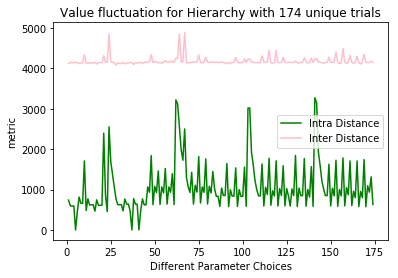

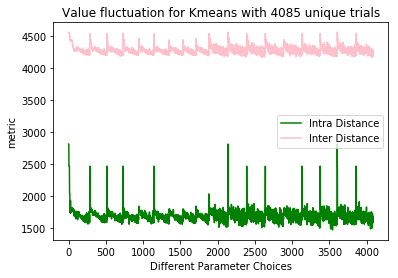

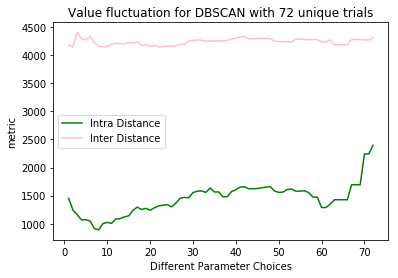

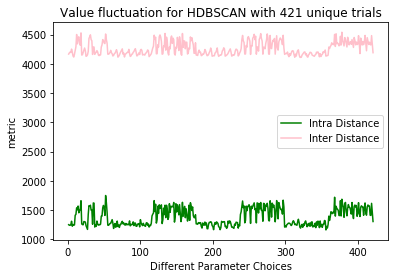

In [387]:
plotSOMAdistance(soma_hier,'Hierarchy')
plotSOMAdistance(soma_kmeans,'Kmeans')
plotSOMAdistance(soma_dbscan,'DBSCAN')
plotSOMAdistance(soma_hdbscan,'HDBSCAN')

In [395]:
import ast

import numpy as np
import matplotlib as mpl
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
def soma_Distance3(uniqueDF,cluster_method,swcDF,metric,kvalue,flipF,size_Z,PERFORmetric):
    somaDF = swcDF.copy()
    if flipF:
        flipZlist=[]
        for iterz in swcDF['z']:
            if iterz>0.5*size_Z:
                flipZlist.append(size_Z-iterz)
            else:
                flipZlist.append(iterz)
        del somaDF['z']
        somaDF['z'] = flipZlist
            
    df_pre = uniqueDF.copy()
    df_pre = df_pre[df_pre['Silhouette Coefficient']!='below'].copy()
    df_pre = df_pre[df_pre['Silhouette Coefficient']!='above'].copy()
    df_pre = df_pre[df_pre['Completeness']!=1].copy()
    
    if PERFORmetric in ['Homogeneity', 'Completeness', 'V-measure', 'Adjusted Rand Index','Adjusted Mutual Information','Silhouette Coefficient']:
        df_pre.sort_values(PERFORmetric,inplace=True,ascending=False)
        delist = df_pre.index[min(100,uniqueDF.shape[0]):]
        df_pre.drop(delist,inplace =True)
            


        
    index_ls = df_pre.index

    colname = ['V','ARI','AMI','SC','parameter','Cluster Num','label list','AVG_intra','AVG_inter']
    df = pd.DataFrame(columns = colname,index = index_ls)
    df['parameter'] = df_pre.loc[index_ls,'parameter']

    #under each parameter
    for iter_idx in df.index:
        _ = ns. get_clusters(method = cluster_method,karg_dict = ast.literal_eval(df.loc[iter_idx]['parameter']))
        somaDF['cluster'] = ns.metadata['Cluster']
        
        V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
        typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
        if cluster_method == 'HDBSCAN':
            delist=np.array([])
            for itertype in typeR:
                if itertype[1]=='-':
                    delist = np.append(delist,itertype)
                if itertype[1]=='0':
                    delist=np.append(delist,itertype)
            detailDF = pd.DataFrame(index = np.setdiff1d(typeR,delist),columns = ['Cluster Type','INTRAlist','INTERlist','AVG_intra','AVG_inter'])
            df.loc[iter_idx,'label list'] = ' '.join([str(i) for i in np.setdiff1d(typeR,delist)])  
        else:
            detailDF = pd.DataFrame(index = typeR,columns = ['Cluster Type','INTRAlist','INTERlist','AVG_intra','AVG_inter'])
            df.loc[iter_idx,'label list'] = ' '.join([str(i) for i in typeR])  
        detailDF.loc[:,'Cluster Type'] = detailDF.index
        if len(typeR)<2:
            SS = 'below'
        elif len(typeR)>=ns.UMAP.shape[0]:
            SS = 'above'
        else:
            SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
            #LABEL LIST CAN BE DETELETED LATER
        

        #UNDER EACH PARAMETER
        # for each cluster result
        for label_idx in typeR:
            intra_list = []
            inter_list = []

            swc_intra = somaDF[somaDF['cluster'] ==label_idx].iloc[:,:-1].copy()#DF
            print(swc_intra.columns)
            swc_inter = somaDF[somaDF['cluster'] !=label_idx].iloc[:,:-1].copy()#DF
            value_intra = swc_intra.values
            value_inter = swc_inter.values
            
            sum_intra = np.zeros((value_intra.shape[0]-1,1))
            for i in range(value_intra.shape[0]):
                #exchange the specific row, make it to be the first row
                cal_intra = value_intra
                if i != 0:
                    cal_intra[[0,i],:] = cal_intra[[i,0],:]
                temp_intra = pdist(cal_intra, metric).reshape((len(pdist(cal_intra, metric)),1))
                # for each sample in that cluster, record the avg intra cluster distance
                intra_list.append(np.sum(temp_intra[:(value_intra.shape[0]-1),:])/(value_intra.shape[0]-1))
            # If a certai cluster only has 1 element, then the intra distance is 'nan'
            detailDF.loc[label_idx,'INTRAlist'] = intra_list#' '.join([str(i) for i in intra_list])    
            detailDF.loc[label_idx,'AVG_intra'] = np.mean(np.array(detailDF.loc[label_idx,'INTRAlist']))
            if kvalue == 'all':
                #sum inter will be a column vector, each element stores the corresponding distance
                sum_inter = np.zeros((value_inter.shape[0],1))
                # for each sample in that cluster
                for i in range(value_intra.shape[0]):
                    cal_inter = np.row_stack((value_intra[i,:],value_inter))
                    temp_inter = pdist(cal_inter, metric).reshape((len(pdist(cal_inter, metric)),1))[:(value_inter.shape[0]),:]
                    #assert(sum_inter.shape == temp_inter.shape,"Inter cluster record does not equal to number of out-cluster samples")
                    sum_inter = sum_inter + temp_inter
                # for each sample in that cluster, record the avg intra cluster distance    
                sum_inter = sum_inter/value_intra.shape[0]
                #row list
                inter_list = sum_inter.tolist()   
            else:
                #sum inter will be a column vector, each element stores the corresponding distance
                sum_inter = np.zeros((min(value_inter.shape[0],kvalue),1))
                # for each sample in that cluster
                for i in range(value_intra.shape[0]):
                    cal_inter = np.row_stack((value_intra[i,:],value_inter))
                    temp_inter = pdist(cal_inter, metric).reshape((len(pdist(cal_inter, metric)),1))[:(min(value_inter.shape[0],kvalue)),:]
                    #assert(sum_inter.shape == temp_inter.shape,"Inter cluster record does not equal to number of out-cluster samples")
                    sum_inter = sum_inter + temp_inter
                # for each sample in that cluster, record the avg intra cluster distance    
                sum_inter = sum_inter/value_intra.shape[0]
                #row list
                inter_list = sum_inter.tolist()                   
            detailDF.loc[label_idx,'INTERlist'] = inter_list   
            #assert(len(inter_list)==somaDF[somaDF['cluster'] !=label_idx].shape[0])
            detailDF.loc[label_idx,'AVG_inter'] = np.mean(np.array(detailDF.loc[label_idx,'INTERlist']))
            detailDF[detailDF .isnull()]=0

        df.loc[iter_idx,'AVG_intra'] = (detailDF['AVG_intra']).sum()/detailDF.shape[0]
        df.loc[iter_idx,'AVG_inter'] = (detailDF['AVG_inter']).sum()/detailDF.shape[0]
        df.loc[iter_idx,'V'] = V
        df.loc[iter_idx,'ARI'] = ARI
        df.loc[iter_idx,'AMI'] = AMI
        df.loc[iter_idx,'SC'] = SS
        typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
        #print(hdbscan_dict)
        df.loc[iter_idx,'Cluster Num'] = len(typeR)          
    return df

In [409]:
soma_hierNOflip = soma_Distance3(unique_hier,'Hierarchy',ns.features['soma_features'].raw_data.copy(),
                               'euclidean',400,0,11400.0,'Adjusted Rand Index')
soma_hierNOflip.to_excel('/home/penglab/Documents/dataSource/soma_hierNOflip.xlsx')

Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering




*************Note:**************
Method centroid requires the distance metric to be Euclidean
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering




*************Note:**************
Method median requires the distance metric to be Euclidean
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering




*************Note:**************
Method ward requires the distance metric to be Euclidean
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='obj

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Hierarchy CLustering
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


In [408]:
soma_kmeansNOflip = soma_Distance3(unique_kmeans,'Kmeans',ns.features['soma_features'].raw_data.copy(),
                               'euclidean',400,0,11400.0,'Adjusted Rand Index')
soma_kmeansNOflip.to_excel('/home/penglab/Documents/dataSource/soma_kmeansNOflip.xlsx')

Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of Kmeans
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


In [407]:
soma_dbscanNOflip= soma_Distance3(unique_dbscan,'DBSCAN',ns.features['soma_features'].raw_data.copy(),
                               'euclidean',400,0,11400.0,'Adjusted Rand Index')
soma_dbscanNOflip.to_excel('/home/penglab/Documents/dataSource/soma_dbscanNOflip.xlsx')

Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.

/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning:

invalid value encountered in double_scalars



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of DBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')


In [406]:
soma_hdbscanNOflip= soma_Distance3(unique_hdbscan,'HDBSCAN',ns.features['soma_features'].raw_data.copy(),
                               'euclidean',400,0,11400.0,'Adjusted Rand Index')
soma_hdbscanNOflip.to_excel('/home/penglab/Documents/dataSource/soma_hdbscanNOflip.xlsx')

/home/penglab/anaconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index([

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN
Index(['x', 'y', 'z'], dtype='object')


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Result of HDBSCAN


/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dtype='object')
Index(['x', 'y', 'z'], dt

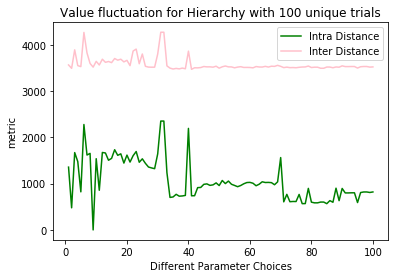

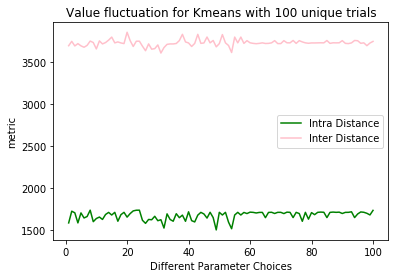

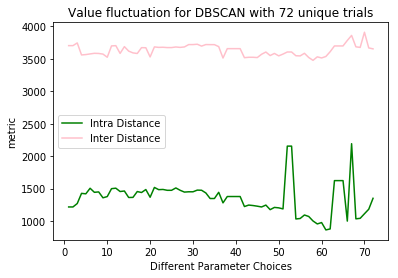

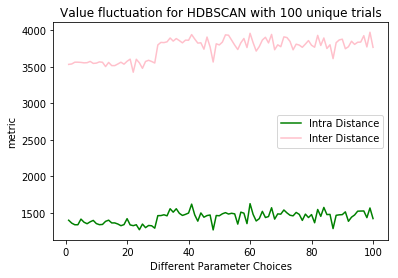

In [405]:
plotSOMAdistance(soma_hierFLIP,'Hierarchy')
plotSOMAdistance(soma_kmeansFLIP,'Kmeans')
plotSOMAdistance(soma_dbscanFLIP,'DBSCAN')
plotSOMAdistance(soma_hdbscanFLIP,'HDBSCAN')

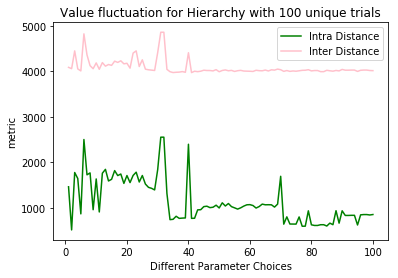

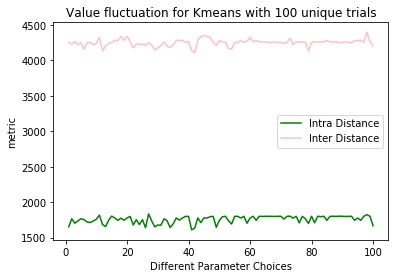

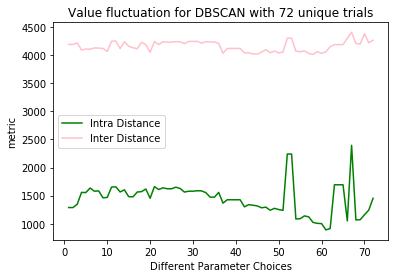

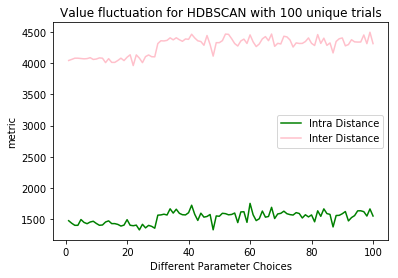

In [410]:
plotSOMAdistance(soma_hierNOflip,'Hierarchy')
plotSOMAdistance(soma_kmeansNOflip,'Kmeans')
plotSOMAdistance(soma_dbscanNOflip,'DBSCAN')
plotSOMAdistance(soma_hdbscanNOflip,'HDBSCAN')

In [260]:
soma_kmeans.shape

(4085, 9)

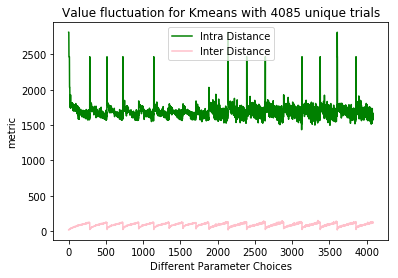

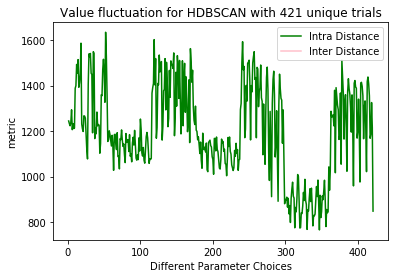

In [265]:
plotSOMAdistance(soma_hdbscan,'HDBSCAN')

In [350]:
soma_hier.columns

Index(['V', 'ARI', 'AMI', 'SC', 'parameter', 'Cluster Num', 'label list',
       'AVG_intra', 'AVG_inter'],
      dtype='object')

In [352]:
import numpy as np
import ast
import matplotlib as mpl
import matplotlib.pyplot as plt
from pylab import *
strname='ARI'
result_avg = pd.DataFrame(columns =['method','parameter','num_Cluster','avg'],index=['Hierarchy','Kmeans','DBSCAN','HDBSCAN','SNN'])
#if strname=='Silhouette Coefficient':
scresult_hier = soma_hier.copy()
scresult_kmeans = soma_kmeans.copy()
scresult_dbscan = soma_dbscan.copy()
scresult_hdbscan = soma_hdbscan.copy()
#scresult_snn = result_snn.copy()

scresult_hier = scresult_hier[scresult_hier['SC']!='below'].copy()
scresult_kmeans = scresult_kmeans[scresult_kmeans['SC']!='below'].copy()
scresult_dbscan = scresult_dbscan[scresult_dbscan['SC']!='below'].copy()
scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['SC']!='below'].copy()
#scresult_snn = scresult_snn[scresult_snn['SC']!='below'].copy()

scresult_hier = scresult_hier[scresult_hier['SC']!='above'].copy()
scresult_kmeans = scresult_kmeans[scresult_kmeans['SC']!='above'].copy()
scresult_dbscan = scresult_dbscan[scresult_dbscan['SC']!='above'].copy()
scresult_hdbscan = scresult_hdbscan[scresult_hdbscan['SC']!='above'].copy()
#scresult_snn = scresult_snn[scresult_snn['SC']!='above'].copy()


row_hier = scresult_hier[scresult_hier[strname]==scresult_hier[strname].max()]#.iloc[0,:]
row_kmeans = scresult_kmeans[scresult_kmeans[strname]==scresult_kmeans[strname].max()]#.iloc[0,:]
row_dbscan = scresult_dbscan[scresult_dbscan[strname]==scresult_dbscan[strname].max()]#.iloc[0,:]
row_hdbscan = scresult_hdbscan[scresult_hdbscan[strname]==scresult_hdbscan[strname].max()]#.iloc[0,:]
#row_snn = scresult_snn[scresult_snn[strname]==scresult_snn[strname].max()].iloc[0,:]



In [359]:
row_hier = scresult_hier[scresult_hier[strname]==scresult_hier[strname].max()]#.iloc[0,:]
display(row_hier)
row_kmeans = scresult_kmeans[scresult_kmeans[strname]==scresult_kmeans[strname].max()]#.iloc[0,:]
display(row_kmeans)
row_dbscan = scresult_dbscan[scresult_dbscan[strname]==scresult_dbscan[strname].max()]#.iloc[0,:]
display(row_dbscan)
row_hdbscan = scresult_hdbscan[scresult_hdbscan[strname]==scresult_hdbscan[strname].max()]#.iloc[0,:]
display(row_hdbscan)
#row_snn = scresult_snn[scresult_snn[strname]==scresult_snn[strname].max()].iloc[0,:]

,V,ARI,AMI,SC,parameter,Cluster Num,label list,AVG_intra,AVG_inter
idx,,,,,,,,,
Hier1378,0.535493,0.331541,0.380471,0.242253,"{'L_method': 'complete', 'L_metric': 'canberra', 'criterionH': 'distance', 'depth': 2, 'R': None, 't': 0.9, 'optimal_ordering': False}",33,C1 C10 C11 C12 C13 C14 C15 C16 C17 C18 C19 C2 C20 C21 C22 C23 C24 C25 C26 C27 C28 C29 C3 C30 C31 C32 C33 C4 C5 C6 C7 C8 C9,1460.07,816.854


,V,ARI,AMI,SC,parameter,Cluster Num,label list,AVG_intra,AVG_inter
idx,,,,,,,,,
KMeans5386,0.539315,0.29729,0.401684,0.705758,"{'n_clusters': 16, 'init': 'random', 'n_init': 11, 'max_iter': 300, 'tol': 0.0001, 'precompute_distances': True, 'verbose': 0, 'random_state': None, 'copy_x': True, 'n_jobs': None, 'algorithm': 'full'}",16,C0 C1 C10 C11 C12 C13 C14 C15 C2 C3 C4 C5 C6 C7 C8 C9,1750.21,84.6742


,V,ARI,AMI,SC,parameter,Cluster Num,label list,AVG_intra,AVG_inter
idx,,,,,,,,,
DBSCAN88,0.491898,0.27331,0.330578,0.57561,"{'eps': 0.445, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",11,C-1 C0 C1 C2 C3 C4 C5 C6 C7 C8 C9,1287.69,425.521
DBSCAN89,0.491898,0.27331,0.330578,0.57561,"{'eps': 0.45, 'min_samples': 5, 'metric': 'euclidean', 'metric_params': None, 'algorithm': 'auto', 'leaf_size': 30, 'p': None, 'n_jobs': None}",11,C-1 C0 C1 C2 C3 C4 C5 C6 C7 C8 C9,1287.69,425.521


,V,ARI,AMI,SC,parameter,Cluster Num,label list,AVG_intra,AVG_inter
idx,,,,,,,,,
HDBSCAN1072,0.570747,0.305538,0.398482,0.579029,"{'min_cluster_size': 5, 'metric': 'manhattan', 'alpha': 0.8, 'min_samples': 2, 'p': 2, 'algorithm': 'generic', 'leaf_size': 40, 'approx_min_span_tree': True, 'gen_min_span_tree': False, 'core_dist_n_jobs': 4, 'cluster_selection_method': 'eom', 'allow_single_cluster': False, 'prediction_data': Fa...",57,C-1 C0 C1 C10 C11 C12 C13 C14 C15 C16 C17 C18 C19 C2 C20 C21 C22 C23 C24 C25 C26 C27 C28 C29 C3 C30 C31 C32 C33 C34 C35 C36 C37 C38 C39 C4 C40 C41 C42 C43 C44 C45 C46 C47 C48 C49 C5 C50 C51 C52 C53 C54 C55 C6 C7 C8 C9,1471.67,453.759


x_axix=range(1,len(colname))


hier_dict=row_hier['parameter']
result_avg.loc['Hierarchy']['parameter'] = (hier_dict)
result_avg.loc['Hierarchy']['avg'] = row_hier['avg']
_ = ns. get_clusters(method='Hierarchy',karg_dict=ast.literal_eval(hier_dict))
_ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
#print('The parameter resulting in best '+str(strname)+' using Hierarchy is '+str(hier_dict))
result_avg.loc['Hierarchy']['num_Cluster']=len(typeR)

kmeans_dict=row_kmeans['parameter']
result_avg.loc['Kmeans']['parameter'] = kmeans_dict
result_avg.loc['Kmeans']['avg'] = row_kmeans['avg']
_ = ns. get_clusters(method='Kmeans',karg_dict=ast.literal_eval(kmeans_dict))
_ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
#print('The parameter resulting in best '+str(strname)+' using Kmeans is '+str(kmeans_dict))
result_avg.loc['Kmeans']['num_Cluster']=len(typeR)

dbscan_dict=row_dbscan['parameter']
result_avg.loc['DBSCAN']['parameter'] = dbscan_dict
result_avg.loc['DBSCAN']['avg'] = row_dbscan['avg']
_ = ns. get_clusters(method='DBSCAN',karg_dict=ast.literal_eval(dbscan_dict))
_ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
#print('The parameter resulting in best '+str(strname)+' using DBSCAN is '+str(dbscan_dict))
result_avg.loc['DBSCAN']['num_Cluster']=len(typeR)

hdbscan_dict=row_hdbscan['parameter']
result_avg.loc['HDBSCAN']['parameter'] = hdbscan_dict
result_avg.loc['HDBSCAN']['avg'] = row_hdbscan['avg']
_ = ns. get_clusters(method='HDBSCAN',karg_dict=ast.literal_eval(hdbscan_dict))
_ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
#print('The parameter resulting in best '+str(strname)+' using HDBSCAN is '+str(hdbscan_dict))
result_avg.loc['HDBSCAN']['num_Cluster']=len(typeR)

#snn_dict=row_snn['parameter']
result_avg.loc['SNN']['parameter'] = {'knn':5,'metric':'minkowski','method':'FastGreedy'}
result_avg.loc['SNN']['avg'] = row_snn['avg']
_ = ns. get_clusters(method='SNN_community',karg_dict={'knn':5,'metric':'minkowski','method':'FastGreedy'})
_ = ns.FeatureScatter(["CellType", "Hemisphere", "Cluster"], map="UMAP")
typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
#print('The parameter resulting in best '+str(strname)+' using HDBSCAN is '+str(hdbscan_dict))
result_avg.loc['SNN']['num_Cluster']=len(typeR)    

plt.title('Result Analysis w.r.t. highest avg value among ARI, AMI and SC')
plt.plot(x_axix, row_hier.tolist()[:-2], color='green', label='Hierarchy clustering')
plt.plot(x_axix, row_kmeans.tolist()[:-2], color='red', label='KMeans clustering')
plt.plot(x_axix, row_dbscan.tolist()[:-2],  color='skyblue', label='DBSCAN clustering')
plt.plot(x_axix, row_hdbscan.tolist()[:-2], color='blue', label='HDBSCAN clustering')
plt.plot(x_axix, row_snn.tolist()[:-2], color='brown', label='SNN clustering')
plt.legend() # 显示图例
a=['','H', 'C', 'V', 'ARI', 'AMI', 'SC']
plt.xticks(arange(len(a)),a)
plt.ylabel('metric')
plt.show()
result_avg['method']=result_avg.index
#print(result_COMP)

In [227]:
uniqueDF=unique_hier.copy()
cluster_method ='Hierarchy'




swcDF=ns.features['soma_features'].raw_data.copy()
metric = 'canberra'
kvalue = 'all'
somaDF = swcDF.copy()
df_pre = uniqueDF.copy()
df_pre = df_pre[df_pre['Silhouette Coefficient']!='below'].copy()
df_pre = df_pre[df_pre['Silhouette Coefficient']!='above'].copy()
df_pre = df_pre[df_pre['Completeness']!=1].copy()
colname = ['V','ARI','AMI','SC','parameter','Cluster Num','label list','AVG_intra','AVG_inter']
index_ls = df_pre.index


df = pd.DataFrame(columns = colname,index = index_ls)
df['parameter'] = df_pre.loc[index_ls,'parameter']

#under each parameter
for iter_idx in df.index:
    
    _ = ns. get_clusters(method = cluster_method,karg_dict = ast.literal_eval(df.loc[iter_idx]['parameter']))
    somaDF['cluster'] = ns.metadata['Cluster']
    V = metrics.v_measure_score(ns.metadata['CellType'],ns.metadata['Cluster'])
    ARI = metrics.adjusted_rand_score(ns.metadata['CellType'],ns.metadata['Cluster'])
    AMI = metrics.adjusted_mutual_info_score(ns.metadata['CellType'],ns.metadata['Cluster'])
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    detailDF = pd.DataFrame(index = typeR,columns = ['Cluster Type','INTRAlist','INTERlist','AVG_intra','AVG_inter'])
    detailDF.loc[:,'Cluster Type'] = detailDF.index
    if len(typeR)<2:
        SS = 'below'
    elif len(typeR)>=ns.UMAP.shape[0]:
        SS = 'above'
    else:
        SS = metrics.silhouette_score(ns.UMAP, ns.metadata['Cluster'], metric='sqeuclidean')
        #LABEL LIST CAN BE DETELETED LATER
    df.loc[iter_idx,'label list'] = ' '.join([str(i) for i in typeR])  
    
    #UNDER EACH PARAMETER
    # for each cluster result
    for label_idx in typeR:
        intra_list = []
        inter_list = []
        
        swc_intra = somaDF[somaDF['cluster'] ==label_idx].iloc[:,:-1].copy()#DF
        swc_inter = somaDF[somaDF['cluster'] !=label_idx].iloc[:,:-1].copy()#DF
        value_intra = swc_intra.values
        value_inter = swc_inter.values
        
        for i in range(value_intra.shape[0]):
            #exchange the specific row, make it to be the first row
            cal_intra=value_intra
            if i != 0:
                cal_intra[[0,i],:] = cal_intra[[i,0],:]
            temp_intra = pdist(cal_intra, metric).reshape((len(pdist(cal_intra, metric)),1))
            # for each sample in that cluster, record the avg intra cluster distance
            intra_list.append(np.sum(temp_intra[:(value_intra.shape[0]-1),:])/(value_intra.shape[0]-1))
        # If a certai cluster only has 1 element, then the intra distance is 'nan'
        detailDF.loc[label_idx,'INTRAlist'] = intra_list#' '.join([str(i) for i in intra_list])    
        detailDF.loc[label_idx,'AVG_intra'] = np.mean(np.array(detailDF.loc[label_idx,'INTRAlist']))
        if kvalue == 'all':
            #sum inter will be a column vector, each element stores the corresponding distance
            sum_inter = np.zeros((value_inter.shape[0],1))
            # for each sample in that cluster
            for i in range(value_intra.shape[0]):
                cal_inter = np.row_stack((value_intra[i,:],value_inter))
                temp_inter = pdist(cal_inter, metric).reshape((len(pdist(cal_inter, metric)),1))[:(value_inter.shape[0]),:]
                assert(sum_inter.shape == temp_inter.shape,"Inter cluster record does not equal to number of out-cluster samples")
                sum_iter = sum_inter + temp_inter
            # for each sample in that cluster, record the avg intra cluster distance    
            sum_iter = sum_iter/value_intra.shape[0]
            #row list
            inter_list = sum_iter.tolist()           
        detailDF.loc[label_idx,'INTERlist'] = inter_list   
        assert(len(inter_list)==somaDF[somaDF['cluster'] !=label_idx].shape[0])
        detailDF.loc[label_idx,'AVG_inter'] = np.mean(np.array(detailDF.loc[label_idx,'INTERlist']))
        detailDF[detailDF .isnull()]=0
    
    df.loc[iter_idx,'AVG_intra'] = (detailDF['AVG_intra']).sum()/detailDF.shape[0]
    df.loc[iter_idx,'AVG_inter'] = (detailDF['AVG_inter']).sum()/detailDF.shape[0]
    df.loc[iter_idx,'V-measure'] = V
    df.loc[iter_idx,'Adjusted Rand Index'] = ARI
    df.loc[iter_idx,'Adjusted Mutual Information'] = AMI
    df.loc[iter_idx,'Silhouette Coefficient'] = SS
    typeR, typeC = np.unique(ns.metadata['Cluster'], return_counts = True)
    #print(hdbscan_dict)
    df.loc[iter_idx,'Cluster Num'] = len(typeR)
    ddd

<>:71: SyntaxWarning:

assertion is always true, perhaps remove parentheses?

<>:71: SyntaxWarning:

assertion is always true, perhaps remove parentheses?

<>:71: SyntaxWarning:

assertion is always true, perhaps remove parentheses?

<ipython-input-227-c53ad0f9c1dc>:71: SyntaxWarning:

assertion is always true, perhaps remove parentheses?

/home/penglab/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:732: FutureWarning:

The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.



Result of Hierarchy CLustering


/home/penglab/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning:

invalid value encountered in double_scalars



NameError: name 'ddd' is not defined